# Training for Thai
***

## *Determining the best location to open a Thai restaurant in Sydney, Australia*

By **Zai Hassan**<br>
26th April 2020

This notebook will provide a walk-through of the steps I have taken as part of Coursera's IBM Data Science capstone project.<br>
<br>

## Internal Notebook Links
[Background and problem description](#Background-and-problem-description)<br>
[Included Data](#Included-Data)<br>
[Methodology Walk-through](#Methodology-Walk-through)<br>

<a id='Background-and-problem-description'></a>

## Background and problem description
<a id='Background-and-problem-description'></a>

Sydney has a very competitive food and restaurant scene, locals are spoilt for choice when deciding to eat out. One of the key drivers fueling this industry is the easy access to fresh and affordable produce. One thing I have noticed in my time here is that Thai cuisine is **extremely** popular. In my suburb alone, there are no less than seven Thai restaurants and they all seem to be in-demand.    

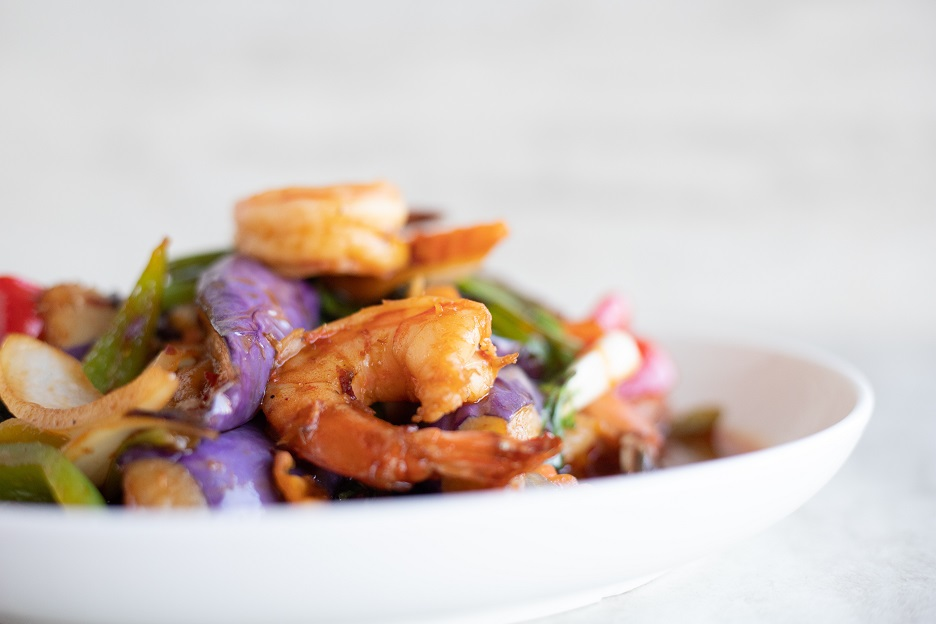

Photo by [Alyssa Kowalski](https://unsplash.com/@lockandkey?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText) on Unsplash<br>
<br>

This brings me to the problem statement we are looking to investigate. If someone were to consider opening a new Thai restaurant, **where would be the most ideal location?** Where is the best location that has access to decent public transport, high population density but perhaps isn't already over-saturated with Thai restaurants.

To better refine the scope of this exercise, this project will look only at areas that have a train station entrance in close proximity. The justification being that there is still a large section of the community that do not drive (or have access to a car), taxis are expensive in Sydney and considering accessibility to trains means increasing the catchment area for potential patrons.

The data sourcing will mainly come via the Foursquare API, in order to look at these key attributes:
- Competing Thai restaurants in the immediate vicinity
- Clusters of restaurants and food services in these areas

Enriching this with population density data from the Australian Bureau of Statistics will enable us to determine the numbers of Thai restaurants per capita, in the hope of finding the answer to the problem statement.  

<a id='Included-Data'></a>

## Included Data

In [1]:
import numpy as np
import pandas as pd
import folium
import json
import os
import requests

### *Train station data*

As indicated in the introduction, we are going to use train station entrances as the fundamental location for retrieving venue data via Foursquare. This will mean we are only targeting particular locations that have an immediate access to the train network.<br>

The latitude and longitude of train station entrances is publically available on the Transport New South Wales open data [website](https://opendata.transport.nsw.gov.au/). Transport NSW is the Government Agency that runs the train network in Sydney (which is in the State of New South Wales in Australia). A free account is required to download this data, as such this information has been uploaded to the Github repository for this notebook.

In [2]:
# Read the dataset into a pandas dataframe

df_stations = pd.read_csv('StationEntrances2020_v4.csv')

df_stations.head()

,Train_Station,Street_Name,Street_Type,Entrance_Type,LAT,LONG,Exit_Number
0,Aberdeen,Macqueen,St,Ramp,-32.166886,150.891957,NaN
1,Aberdeen,Macqueen,St,Stairs,-32.166900,150.891975,NaN
2,Adamstown,Park,Ave,Path,-32.933706,151.720452,NaN
3,Adamstown,Park,Ave,Path,-32.933827,151.720236,NaN
4,Adamstown,St James,Rd,Stairs,-32.933414,151.720363,NaN


Above we can see that the latitude and longitude data is available for each train station. As part of the methodology walk-through we will need to filter this complete dataset for Sydney train stations only. The complete dataset is for all stations in the State of New South Wales which is a very large area. We will also look to retrieve data for only one entrance per train station (there are usually at least 2).

### *Foursquare Data*

As per the capstone project requirements, we will be using the Foursquare API to retrieve venue data around the vicinity of train stations. We will look at a radius of 650 metres and we will particularly focus on Thai restaurants already in the area.

In [3]:
CLIENT_ID = '' # Foursquare ID
CLIENT_SECRET = '' # Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100
radius = 650

In [4]:
# Define a function to return the venue information through Foursquares API

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [5]:
# For demonstration purposes use top 50 rows from the train station data set.
# During the methodology stage we will refine this data set as most stations have multiple entrances.

df_stations_top_10 = df_stations.head(10)

In [6]:
#Retrieve venues around Toronto

df_venues = getNearbyVenues(names=df_stations_top_10['Train_Station'],
                                   latitudes=df_stations_top_10['LAT'],
                                   longitudes=df_stations_top_10['LONG']
                                  )

Aberdeen
Aberdeen
Adamstown
Adamstown
Adamstown
Adamstown
Albion Park
Albion Park
Albion Park
Albion Park


In [7]:
df_venues.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Aberdeen,-32.166886,150.891957,Aberdeen Station,-32.166837,150.891829,Train Station
1,Aberdeen,-32.166886,150.891957,Reliance Motor Sport Motorcycle Specialists,-32.167377,150.891841,Motorcycle Shop
2,Aberdeen,-32.166900,150.891975,Aberdeen Station,-32.166837,150.891829,Train Station
3,Aberdeen,-32.166900,150.891975,Reliance Motor Sport Motorcycle Specialists,-32.167377,150.891841,Motorcycle Shop
4,Adamstown,-32.933706,151.720452,Adamstown Train Gates,-32.933192,151.720401,Train Station
5,Adamstown,-32.933706,151.720452,The Gates Hotel,-32.933370,151.721400,Beer Garden
6,Adamstown,-32.933706,151.720452,Adamstown Station,-32.933759,151.720079,Train Station
7,Adamstown,-32.933706,151.720452,The Nags Head Hotel,-32.935290,151.725370,Pub
8,Adamstown,-32.933827,151.720236,Adamstown Train Gates,-32.933192,151.720401,Train Station
9,Adamstown,-32.933827,151.720236,The Gates Hotel,-32.933370,151.721400,Beer Garden


As we can see, Foursquare has reliably returned venue information from around these geo-coordinates. We will then use this information to understand how many Thai restaurants are already operating in the immediate area, as well as using this information to cluster areas to identify food and restaurant hubs.

### *Statistical Area 1 Socio-economic Indexes for Australia*

The Australian Bureau of Statistics (ABS) is a Federal Government Agency in Australia that collects all sorts of population statistics through a 5 yearly census. This data is de-identified, but it is very useful as they collect all data on attributes like population density, remoteness and socio-economic indexes.

For this excercise we are interested in the population density, and also the socio-economice index of a statistical area. Statistical areas are an official region defined by the ABS. Statistical area 1 (SA1) is the smallest unit for release of census data. More information on SA1 can be found [here](<https://www.abs.gov.au/websitedbs/D3310114.nsf/home/Australian+Statistical+Geography+Standard+(ASGS)>).

The data file we are interested in is publically available [here](https://www.abs.gov.au/AUSSTATS/abs@.nsf/DetailsPage/2033.0.55.0012016?OpenDocument) as a zip file called *Statistical Area Level 1, Indexes, SEIFA 2016*. The Table 1 summary contains the appropriate dataset, which has been stored for convenience in the GitHub repository.

In [8]:
# Load the Socio-Economic Indexes for Areas (SEIFA) data in a pandas dataframe

df_SEIFA = pd.read_excel('SEIFA SA1.xlsx')

In [9]:
df_SEIFA.head(10)

,Unnamed: 0,Unnamed: 1,Index of Relative Socio-economic Advantage and Disadvantage,Unnamed: 3,Index of Education and Occupation,Unnamed: 5,Unnamed: 6
0,2016 Statistical Area Level 1 (SA1) 7-Digit Code,2016 Statistical Area Level 1 (SA1) 11-Digit ...,IRSAD Score,IRSAD Decile,Occ Score,Occ Decile,Usual Resident Population
1,1100701,10102100701,972,4,984,5,256
2,1100702,10102100702,1044,7,1055,7,381
3,1100703,10102100703,962,4,1010,6,428
4,1100704,10102100704,970,4,1026,6,446
5,1100705,10102100705,936,3,979,5,402
6,1100706,10102100706,943,3,942,3,249
7,1100707,10102100707,1016,6,1047,7,359
8,1100708,10102100708,1046,7,1111,9,458
9,1100709,10102100709,1063,8,1048,7,380


There are two header rows which we can fix as part of the data cleanup steps. The usual resident population is what we are most interestd in, along with the index for relative socio-economic advantage and disadvantage. This will give us an idea of an area's affluence and potential disposable income. It might highlight whether residents will have a willingness to eat out.

### *Statistical Area 1 to 4 lookup file*

The ABS also publish lookup files to match all the statistical areas (1 through to 4). This information is publically available [here]("https://www.abs.gov.au/AUSSTATS/abs@.nsf/DetailsPage/1270.0.55.001July%202016?OpenDocument") as a zip file called *Statistical Area Level 1 (SA1) ASGS Edition 2016 in .csv Format*. We will use this file when we need to filter other datasets for Sydney SA1 areas.

In [10]:
df_SA1lookup = pd.read_csv('SA1 lookup.csv')

In [11]:
df_SA1lookup.head(10)

,SA1_MAINCODE_2016,SA1_7DIGITCODE_2016,SA2_MAINCODE_2016,SA2_5DIGITCODE_2016,SA2_NAME_2016,SA3_CODE_2016,SA3_NAME_2016,SA4_CODE_2016,SA4_NAME_2016,GCCSA_CODE_2016,GCCSA_NAME_2016,STATE_CODE_2016,STATE_NAME_2016,AREA_ALBERS_SQKM
0,10102100701,1100701,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,362.8727
1,10102100702,1100702,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,229.7459
2,10102100703,1100703,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,2.3910
3,10102100704,1100704,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,1.2816
4,10102100705,1100705,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,1.1978
5,10102100706,1100706,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,63.3894
6,10102100707,1100707,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,442.7713
7,10102100708,1100708,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,1137.7239
8,10102100709,1100709,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,350.9881
9,10102100710,1100710,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,825.9908


Looking at this data we are interested in the SA1 and SA4 codes as it will allow us to perform filtering for the areas we are interested in.

### *Statistical Area 1 Shapefiles*

Shapefiles for statistical area 1 (SA1) constructs are freely available on the ABS website [here](https://www.abs.gov.au/AUSSTATS/abs@.nsf/DetailsPage/1270.0.55.001July%202016?OpenDocument). The particular file we will be using in this exercise is called *Statistical Area Level 1 (SA1) ASGS Ed 2016 Digital Boundaries in ESRI Shapefile Format*. The latest release is from 2016, since the ABS only performs the census every 5 years the next official release will be in 2021, so these are the latest.

In [12]:
# Lets create a map of Sydney to give some perspective on the area we wish to analyse

sydney_map = folium.Map(location=[-33.893831, 151.125733], zoom_start=11)

sydney_map

<br>
<br>
Using the shapefile downloaded from the ABS, an external GIS tool called QGIS has been used to create a GEOJSON file of just Sydney SA1 regions. This tool has been used because the shapefile is massive, and allows for a visual manipulation of the vector layer to ensure the right features are selected. Simple filtering was done on statistical area 4 (SA4) to search for the term 'Sydney'.

In [13]:
# Load the GEOJSON file so it can be used in folium

sydney_geojson = json.load(open(r"Sydney SA1 - simplified.geojson"))
#sydney_geojson = json.load(open(r'C:\Users\Zai\Git\projects\Coursera_Capstone\Data Files\1270055001_sa1_2016_aust_shape\Sydney SA1.geojson'))

In [14]:
# Load the file into a dataframe to verify the filtering done using QGIS 

df_sydney = pd.DataFrame(sydney_geojson)

df_sydney.head()

,type,features
0,FeatureCollection,"{'type': 'Feature', 'properties': {'SA1_MAIN16..."
1,FeatureCollection,"{'type': 'Feature', 'properties': {'SA1_MAIN16..."
2,FeatureCollection,"{'type': 'Feature', 'properties': {'SA1_MAIN16..."
3,FeatureCollection,"{'type': 'Feature', 'properties': {'SA1_MAIN16..."
4,FeatureCollection,"{'type': 'Feature', 'properties': {'SA1_MAIN16..."


In [15]:
# Create a dictionary from the features column to confirm SA4

example_dict = df_sydney.iloc[[0],[1]].to_dict()
example_dict

{'features': {0: {'type': 'Feature',
   'properties': {'SA1_MAIN16': '11501129001',
    'SA1_7DIG16': '1129001',
    'SA2_MAIN16': '115011290',
    'SA2_5DIG16': '11290',
    'SA2_NAME16': 'Baulkham Hills (East)',
    'SA4_NAME16': 'Sydney - Baulkham Hills and Hawkesbury',
    'STE_NAME16': 'New South Wales',
    'AREASQKM16': 0.274},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[150.99443028000007, -33.76461951599998],
       [150.9944598080001, -33.76449549199998],
       [150.99385609900003, -33.763934793999965],
       [150.9948060470001, -33.76350977499993],
       [150.99598561800008, -33.76466163999993],
       [150.99783850400001, -33.76710745199995],
       [150.99876465500006, -33.76805489199995],
       [150.99214238700006, -33.76975099099997],
       [150.99123623800006, -33.767203706999965],
       [150.990663626, -33.76716317299997],
       [150.9905512790001, -33.76607121099994],
       [150.99109848700004, -33.76603097399993],
       [150.99443028000007

In [16]:
# Confirm the SA4 name in the dictionary

example_dict["features"][0]["properties"]["SA4_NAME16"]

'Sydney - Baulkham Hills and Hawkesbury'

In [17]:
# We will now look at overlaying the GEOJSON layer onto the Sydney map. 
# First we define a function to optimise the line weight as the map will get very busy

def line_weight(feature):
    return {'opacity': 1, 
            'weight': 0.5,}

In [18]:
# Then we add the GEOJSON layer to the Sydney map.

folium.GeoJson(
    sydney_geojson,
    name='geojson',
    style_function=line_weight
).add_to(sydney_map)

In [19]:
sydney_map

<a id='Methodology-Walk-through'></a>

## Methodology Walk-through